## If fetching data from Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


# Dataset

In [0]:
!unzip -qq '/content/DeepNet.zip'

In [0]:
!pip install -q kaggle

In [2]:
!mkdir .kaggle

import json
import os
token = {"username":"rvk007","key":"e88895c824e0311fffda49bb07438f33"}
with open('.kaggle/kaggle.json', 'w') as f:
  json.dump(token, f)

!chmod 600 /content/.kaggle/kaggle.json
os.environ['KAGGLE_CONFIG_DIR'] = '/content/.kaggle'
!kaggle datasets download -d shanwizard/modest-museum-dataset
!unzip -qq '/content/modest-museum-dataset.zip' 

100% 6.02G/6.03G [02:21<00:00, 29.1MB/s]
100% 6.03G/6.03G [02:21<00:00, 45.7MB/s]


In [0]:
%%time
!unzip -qq '/content/gdrive/My Drive/modest_museum_dataset/modest_museum_dataset.zip' -d .

CPU times: user 752 ms, sys: 117 ms, total: 869 ms
Wall time: 6min 57s


# Imports

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import PIL
import numpy as np
import random

from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

# Import Packages

In [0]:
from deepnet.data.dataset.modest import ModestMuseum
from deepnet.utils.cuda import initialze_cuda

from deepnet.model.models.model import MaskNet3, DepthMaskNet
from deepnet.model.train import Train

from deepnet.model.losses.loss_combination import BCE_RMSE_LOSS, SSIM_RMSE_LOSS, BCE_SSIM_LOSS, RMSE_SSIM_LOSS, SSIM_DICE_LOSS, RMSE_DICE_LOSS
from deepnet.model.losses.ssim import SSIM, MS_SSIM
from deepnet.model.losses.dice_loss import DiceLoss

from deepnet.utils.plot import Plot
from deepnet.utils.checkpoint import Checkpoint
from deepnet.utils.summary import summary
from deepnet.utils.tensorboard import Tensorboard

# Initialize Cuda

In [3]:
%%time
cuda, device = initialze_cuda(1)

Is CUDA Available? True
CPU times: user 6.08 ms, sys: 23.2 ms, total: 29.3 ms
Wall time: 33.6 ms


## Device Description

In [4]:
!nvidia-smi

Mon May 25 10:28:06 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P8    33W / 149W |     11MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

# Load Dataset

In [7]:
%%time 
modest = ModestMuseum(
    cuda= cuda,
    batch_size = 128,
    num_workers = 16,
    path = 'modest_museum_dataset',
    resize=(96,96),
    hsv = 0.4,
    bright_contrast = 0.2,
    train_test_split=0.7,
    seed=1)

CPU times: user 7.26 s, sys: 199 ms, total: 7.45 s
Wall time: 7.46 s


# Dataloader

In [0]:
trainloader = modest.dataloader(train=True)
testloader = modest.dataloader(train=False)

# Dataset Visualization

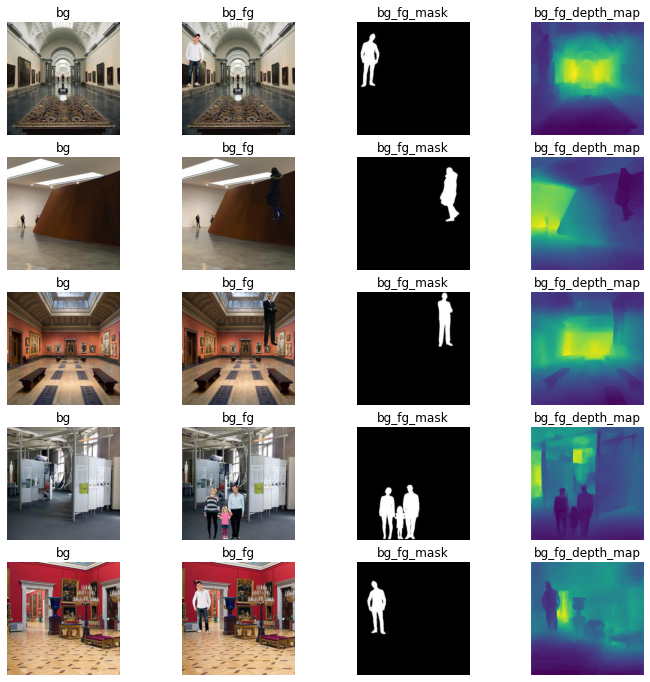

In [9]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

columns = 4
rows = 5

images = []
for i in range(rows):
    idx = random.randint(0, len(trainloader))
    batch = trainloader.dataset.dataset[idx]
    images.append(batch['bg'])
    images.append(batch['bg_fg'])
    images.append(batch['bg_fg_mask'])
    images.append(batch['bg_fg_depth'])

fig=plt.figure(figsize=(12,12))


for i in range(1, columns*rows +1):
    img = Image.open(images[i-1])
    fig.add_subplot(rows, columns, i)
    plt.axis('off')

    if images[i-1].split('/')[1] == 'bg':
      plt.title('bg')
      plt.imshow(img)

    elif images[i-1].split('/')[1] == 'bg_fg':
      plt.title('bg_fg')
      plt.imshow(img)

    elif images[i-1].split('/')[1] == 'bg_fg_mask':
      plt.title('bg_fg_mask')
      plt.imshow(img, cmap='gray')

    elif images[i-1].split('/')[1] == 'bg_fg_depth_map':
      plt.title('bg_fg_depth_map')
      plt.imshow(img)

plt.show()

# Model Architecture

In [10]:
%%time
model = DepthMaskNet()
model = model.to(device)
summary(model, {k:v for idx,(k,v) in enumerate(modest.input_size.items()) if idx<2 })

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 224, 224]             448
       BatchNorm2d-2         [-1, 16, 224, 224]              32
              ReLU-3         [-1, 16, 224, 224]               0
            Conv2d-4         [-1, 16, 224, 224]           2,320
       BatchNorm2d-5         [-1, 16, 224, 224]              32
              ReLU-6         [-1, 16, 224, 224]               0
            Conv2d-7         [-1, 16, 224, 224]             448
       BatchNorm2d-8         [-1, 16, 224, 224]              32
              ReLU-9         [-1, 16, 224, 224]               0
           Conv2d-10         [-1, 16, 224, 224]           2,320
      BatchNorm2d-11         [-1, 16, 224, 224]              32
             ReLU-12         [-1, 16, 224, 224]               0
        MaxPool2d-13         [-1, 16, 112, 112]               0
           Conv2d-14         [-1, 16, 1

# Tensorboard

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 534), started 4:37:46 ago. (Use '!kill 534' to kill it.)

<IPython.core.display.Javascript object>

In [11]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Training
## Modify Learner Class

In [0]:
class ModestTrain(Train):
    def __init__(self):
        return

    def _fetch_data(self, batch, device):
        feature = {}
        feature['bg'] = batch['bg'].to(device)
        feature['bg_fg'] = batch['bg_fg'].to(device)
        
        target = {}
        target['bg_fg_mask'] = batch['bg_fg_mask'].to(device)
        target['bg_fg_depth'] = batch['bg_fg_depth'].to(device)
        return feature, target

    def _fetch_result(self, prediction):
        pred = {
            'bg_fg_mask' : (prediction[0]),
            'bg_fg_depth' : torch.sigmoid(prediction[1])
        }
        return pred

    def _fetch_sigmoid_data(self, prediction):
        pred = {
            'bg_fg_mask' : torch.sigmoid(prediction[0]),
            'bg_fg_depth' : torch.sigmoid(prediction[1])
        }
        return pred
        
modest_train = ModestTrain()

## Optimizer and Scheduler

In [0]:
optimizer = optim.SGD(model.parameters(), lr=0.01, weight_decay=1e-8, momentum=0.9)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True,
                                                 threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=0,
                                                 eps=1e-08)

## Sample Images for Tensorboard

In [14]:
%%time
img_idxes = random.sample(range(len(modest._test_data)), 32)

# Prepare Images
images = {
    'bg': modest._test_data[img_idxes[0]]['bg'].unsqueeze(0),
    'bg_fg': modest._test_data[img_idxes[0]]['bg_fg'].unsqueeze(0)
}

for idx in img_idxes[1:]:
    images['bg'] = torch.cat((
        images['bg'], modest._test_data[idx]['bg'].unsqueeze(0)
    ), 0)
    images['bg_fg'] = torch.cat((
        images['bg_fg'], modest._test_data[idx]['bg_fg'].unsqueeze(0)
    ), 0)


images['bg'] = images['bg'].to(device)
images['bg_fg'] = images['bg_fg'].to(device)

CPU times: user 391 ms, sys: 15.5 ms, total: 406 ms
Wall time: 570 ms


# BCE-RMSE Loss

In [0]:
model_bce_rmse = model

criterion = BCE_RMSE_LOSS()
checkpoint = Checkpoint('bce_rmse_alb/checkpoint.pth', monitor='Loss', verbose=1)
tensorboard = Tensorboard('runs/bce_rmse_alb',images)

In [17]:
%%time
epochs = 5

model_bce_rmse.learner(
    model_bce_rmse,
    tensorboard,
    modest_train,
    trainloader,
    testloader,
    device,
    optimizer,
    criterion,
    epochs,
    metrics=['rmse','iou'],
    callbacks=[scheduler, checkpoint]
)

Epoch 1:
2188/2188 [========] - 2123s 970ms/step|mask_loss: 0.1486|mask_rmse: 3.7324|mask_iou: 0.2358|depth_loss: 0.1486|depth_rmse: 3.7358|depth_iou: 0.2359

 Validation: |mask_loss: 0.090619 |mask_rmse: 6.441 |mask_iou: 0.393 |depth_loss: 0.090619 |depth_rmse: 6.442 |depth_iou: 0.393 


Epoch 00002: Loss improved from inf to 0.00072
Epoch 2:
2188/2188 [========] - 2111s 965ms/step|mask_loss: 0.0856|mask_rmse: 6.7203|mask_iou: 0.4079|depth_loss: 0.0856|depth_rmse: 6.7291|depth_iou: 0.4075

 Validation: |mask_loss: 0.070601 |mask_rmse: 7.9 |mask_iou: 0.442 |depth_loss: 0.070601 |depth_rmse: 7.902 |depth_iou: 0.442 


Epoch 00003: Loss improved from 0.00072 to 0.00060
Epoch 3:
2188/2188 [========] - 2089s 955ms/step|mask_loss: 0.0753|mask_rmse: 7.9049|mask_iou: 0.4486|depth_loss: 0.0753|depth_rmse: 7.9155|depth_iou: 0.4482

 Validation: |mask_loss: 0.066326 |mask_rmse: 8.67 |mask_iou: 0.464 |depth_loss: 0.066326 |depth_rmse: 8.672 |depth_iou: 0.464 


Epoch 00004: Loss improved from 0.0

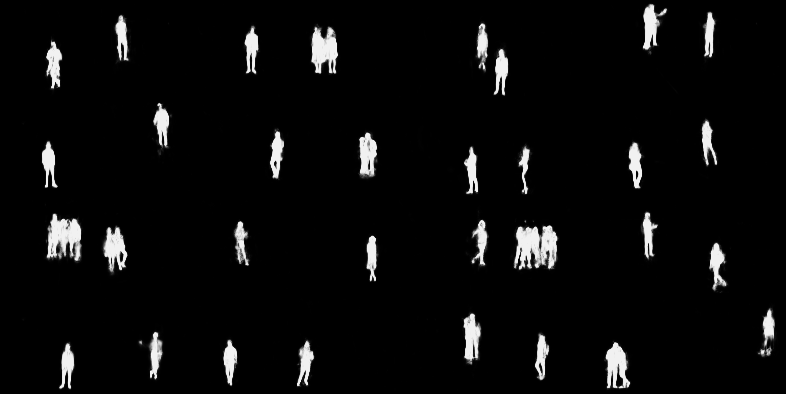

In [3]:
plot_pred('runs/masks', 0)

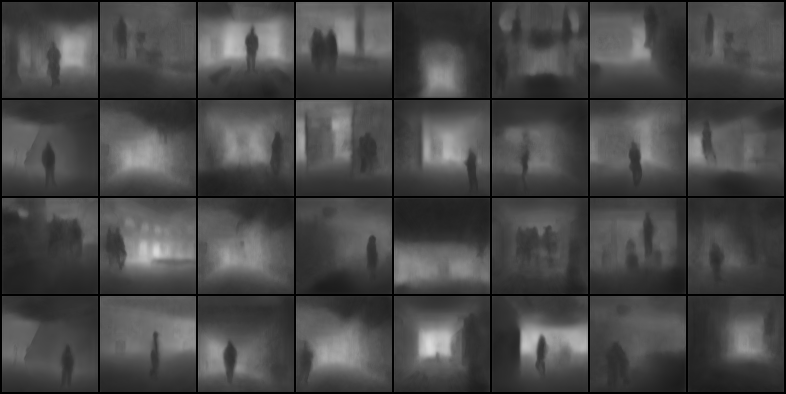

In [4]:
plot_pred('runs/depth', 0)

In [0]:
import pickle
def pkl(res, file):
  with open(file, 'wb') as f:
    pickle.dump(res, f)

In [0]:
!mkdir weights
!mkdir imgs
!mkdir imgs/bce_rmse
!mv *.png imgs/bce_rmse
!mv bce_rmse weights
pkl(model_bce_rmse.results, 'bce_rmse.pkl')
!zip -r m.zip weights imgs runs bce_rmse.pkl

/usr/local/lib/python3.6/dist-packages/torch/storage.py:34: FutureWarning: pickle support for Storage will be removed in 1.5. Use `torch.save` instead
  warnings.warn("pickle support for Storage will be removed in 1.5. Use `torch.save` instead", FutureWarning)


  adding: weights/ (stored 0%)
  adding: weights/bce_rmse/ (stored 0%)
  adding: weights/bce_rmse/checkpoint.pth (deflated 8%)
  adding: imgs/ (stored 0%)
  adding: imgs/bce_rmse/ (stored 0%)
  adding: imgs/bce_rmse/img_1_result_1.png (deflated 1%)
  adding: imgs/bce_rmse/img_0_result_1.png (deflated 1%)
  adding: imgs/bce_rmse/img_1_result_3.png (deflated 1%)
  adding: imgs/bce_rmse/img_1_result_2.png (deflated 1%)
  adding: imgs/bce_rmse/img_0_result_2.png (deflated 2%)
  adding: imgs/bce_rmse/img_0_result_3.png (deflated 3%)
  adding: runs/ (stored 0%)
  adding: runs/bce_rmse/ (stored 0%)
  adding: runs/bce_rmse/events.out.tfevents.1590366564.f045f389080c.1972.0 (deflated 1%)
  adding: bce_rmse.pkl (deflated 49%)


In [0]:
!cp m.zip '/content/gdrive/My Drive'

In [20]:
%%time
epochs = 5
#epoch 6-10
model_bce_rmse.learner(
    model_bce_rmse,
    tensorboard,
    modest_train,
    trainloader,
    testloader,
    device,
    optimizer,
    criterion,
    epochs,
    metrics=['rmse','iou'],
    callbacks=[scheduler, checkpoint]
)

Epoch 1:
2188/2188 [========] - 2112s 965ms/step|mask_loss: 0.0643|mask_rmse: 9.4064|mask_iou: 0.4830|depth_loss: 0.0643|depth_rmse: 9.4190|depth_iou: 0.4826

 Validation: |mask_loss: 0.060534 |mask_rmse: 9.886 |mask_iou: 0.488 |depth_loss: 0.060534 |depth_rmse: 9.888 |depth_iou: 0.488 


Epoch 00002: Loss improved from inf to 0.00048
Epoch 2:
2188/2188 [========] - 2105s 962ms/step|mask_loss: 0.0624|mask_rmse: 9.6949|mask_iou: 0.4877|depth_loss: 0.0624|depth_rmse: 9.7079|depth_iou: 0.4872

 Validation: |mask_loss: 0.059569 |mask_rmse: 10.14 |mask_iou: 0.491 |depth_loss: 0.059569 |depth_rmse: 10.143 |depth_iou: 0.491 


Epoch 00003: Loss improved from 0.00048 to 0.00047
Epoch 3:
2188/2188 [========] - 2110s 964ms/step|mask_loss: 0.0610|mask_rmse: 9.9531|mask_iou: 0.4913|depth_loss: 0.0610|depth_rmse: 9.9664|depth_iou: 0.4907

 Validation: |mask_loss: 0.057942 |mask_rmse: 10.379 |mask_iou: 0.495 |depth_loss: 0.057942 |depth_rmse: 10.381 |depth_iou: 0.495 


Epoch 00004: Loss improved fr

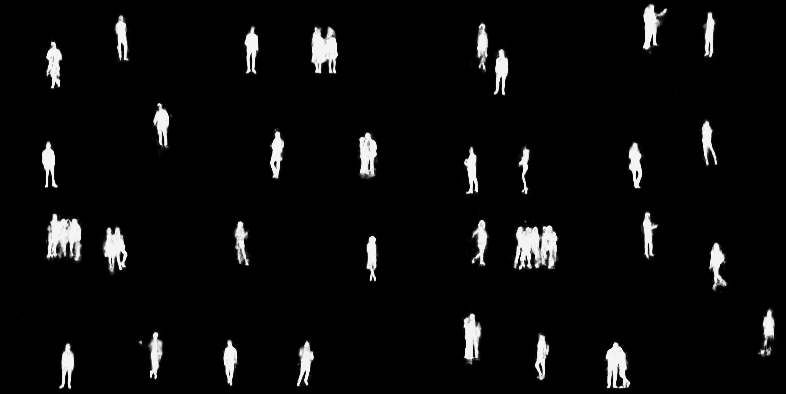

In [5]:
plot_pred('runs/masks', 5)

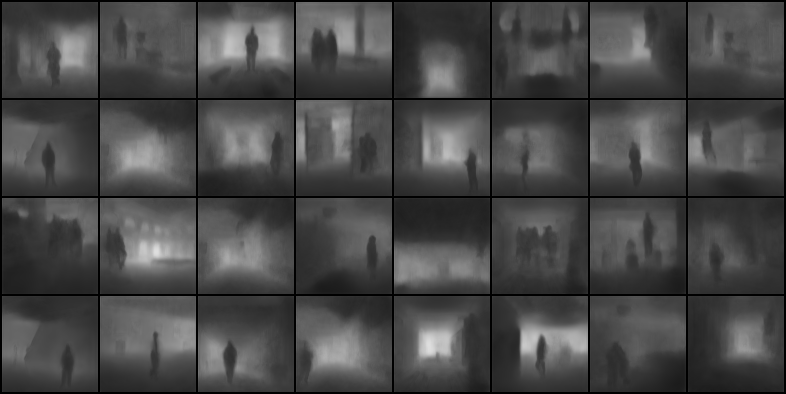

In [6]:
plot_pred('runs/depth', 5)